# MLP for CIFAR10

This is very similar to the MNIST MLP. Notable changes will be highlighted below.

###**Observations After Optimisation and Regularisation**

1. Changed the optimizer from **SGD to Adam** with a learning rate of `0.001`.  
   → Achieved **94% training accuracy** and **49% validation accuracy**.

2. Added `ReduceLROnPlateau` learning rate scheduler.  
   → Achieved **99.9% training accuracy** and **53% validation accuracy**.

3. Included `Batch Normalization` and removed bias initialization.  
   → Achieved **99.9% training accuracy** and **59% validation accuracy**.

4. Added `AdamW` optimizer.  
   → No significant difference observed in the accuracies.

5. Implemented `Early Stopping` with 200 epochs and patience of 10.  
   → Achieved **90% training accuracy** and **53% validation accuracy**.

6. Applied `Data Augmentation` techniques:  
   `RandomCrop`, `RandomRotation`, `RandomHorizontalFlip`, `ColorJitter`.  
   → Achieved **67% training accuracy** and **62% validation accuracy**.

7. Applied `Label Smoothing` with a factor of `0.05`.  
   → Achieved **70% training accuracy** and **63% validation accuracy**.


In [ ]:
from time import perf_counter

import torch
import numpy as np
from matplotlib import pyplot as plt

from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision.transforms import ToTensor, v2, transforms
from torch.utils.tensorboard import SummaryWriter

%load_ext tensorboard

train_transforms = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

test_transforms = transforms.Compose([
    transforms.CenterCrop(32),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
])

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


`torchvision` comes with the CIFAR datasets, so we just download it here.

In [ ]:
train_data = datasets.CIFAR10(
    root="data",
    train=True,
    download=True,
    transform=train_transforms)

test_data = datasets.CIFAR10(
    root="data",
    train=False,
    download=True,
    transform=test_transforms)

In [ ]:
batch_size = 128

# Create data loaders.
train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=True,
                              num_workers=8)
test_dataloader = DataLoader(test_data, batch_size=batch_size,
                             num_workers=8)

for X, y in test_dataloader:
    print(f"Shape of X [N, C, H, W]: {X.shape}")
    print(f"Shape of y: {y.shape} {y.dtype}")
    break

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Shape of X [N, C, H, W]: torch.Size([128, 3, 32, 32])
Shape of y: torch.Size([128]) torch.int64


## Plotting training data

It is generally a good idea to have a look at our data. This is especially true if you include data augmentation -- you can make sure that your augmentations aren't too extreme.

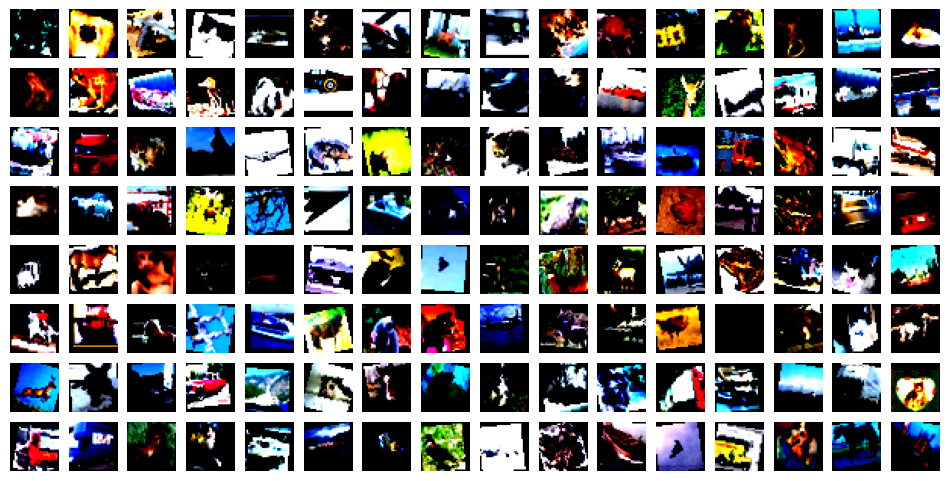

In [ ]:
for X, _ in train_dataloader:
    plt.figure(figsize=(12, 6))
    for ind, img in enumerate(X):
        plt.subplot(8, 16, ind+1)
        plt.imshow(img.permute((1, 2, 0)))
        plt.axis("off")
    plt.show()
    break

We could also look a some dataset statistics again! We can see that the pixel vaule distribution is very different from MNIST; while there are still peaks near 0 and 1, we have plenty of values inbetween, with a sort-of Gaussian distribution. Also, the labels are actually balanced; there are 5000 images for each class.

In [ ]:
# first we gotta extract the data from the dataloader
images_np = []
labels_np = []

for image_batch, label_batch in train_dataloader:
    images_np.append(image_batch.numpy())
    labels_np.append(label_batch.numpy())

images_np = np.concatenate(images_np)
labels_np = np.concatenate(labels_np)

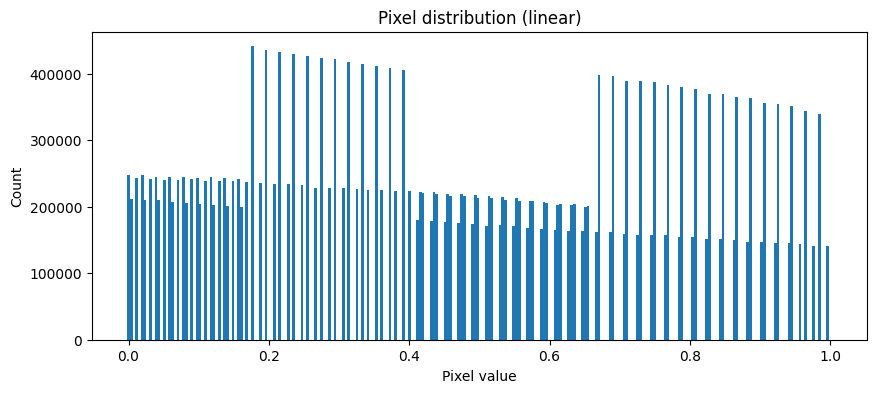

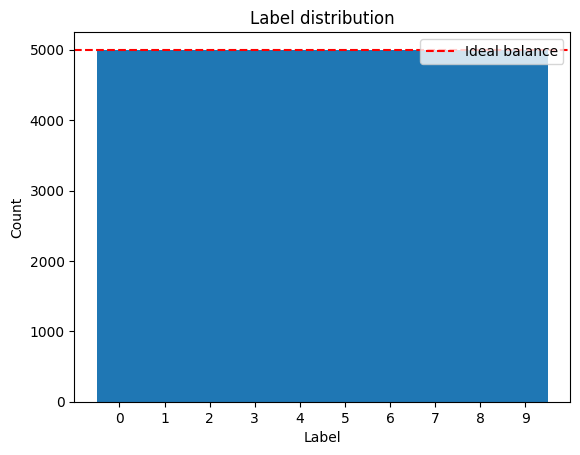

In [ ]:
# this code is as in the MNIST examples.
# so see those notebooks for some notes on the binning.
bins = np.arange(-0.5, 256.5, 1) / 255
plt.figure(figsize=(10, 4))
plt.hist(images_np.reshape(-1), bins=bins)
plt.title("Pixel distribution (linear)")
plt.xlabel("Pixel value")
plt.ylabel("Count")
plt.show()

# now the labels
bins = np.arange(-0.5, 10.5, 1)
plt.hist(labels_np, bins=bins)
plt.hlines(5000, -1, 10, colors="red", linestyles="dashed", label="Ideal balance")

plt.xticks(np.arange(10))
plt.xlim(-1, 10)
plt.title("Label distribution")
plt.xlabel("Label")
plt.ylabel("Count")
plt.legend()
plt.show()

## Model

Here we build a simple MLP with three hidden layers with 1024 units each and GELU activation. This is by no means an ideal architecture, so you can tune it if you wish. It just serves as a starting point.

The `model` object is where you would include Batch Normalization and/or Dropout layers.

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")


model = nn.Sequential(nn.Flatten(),
                      nn.Linear(32*32*3, 1024, bias=False),
                      nn.BatchNorm1d(1024),
                      nn.GELU(),
                      nn.Linear(1024, 1024, bias=False),
                      nn.BatchNorm1d(1024),
                      nn.GELU(),
                      nn.Linear(1024, 1024, bias=False),
                      nn.BatchNorm1d(1024),
                      nn.GELU(),
                      nn.Linear(1024, 10)).to(device)
print(model)


def glorot_init(layer: nn.Module):
    if isinstance(layer, nn.Linear):
        nn.init.xavier_uniform_(layer.weight)
        #nn.init.zeros_(layer.bias)


with torch.no_grad():
    model.apply(glorot_init)

Using cuda device
Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=3072, out_features=1024, bias=False)
  (2): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (3): GELU(approximate='none')
  (4): Linear(in_features=1024, out_features=1024, bias=False)
  (5): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (6): GELU(approximate='none')
  (7): Linear(in_features=1024, out_features=1024, bias=False)
  (8): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): GELU(approximate='none')
  (10): Linear(in_features=1024, out_features=10, bias=True)
)


In [ ]:
# this learning rate is fairly high and somewhat at the "edge of chaos"
# -- we are risking our model diverging and getting "nan" loss.
loss_fn = nn.CrossEntropyLoss(label_smoothing=0.05)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=10, threshold=0.0001, threshold_mode='rel', cooldown=0, min_lr=0, eps=1e-08)

In [ ]:
def train_model(model: nn.Module,
                loss_fn: nn.Module,
                optimizer: torch.optim.Optimizer,
                training_loader: DataLoader,
                validation_loader: DataLoader,
                n_epochs: int,
                verbose: bool = True):
    n_training_examples = len(training_loader.dataset)
    batches_per_epoch = n_training_examples // training_loader.batch_size
    print("Running {} epochs at {} steps per epoch.".format(n_epochs, batches_per_epoch))

    # note, for training we only track the average over the epoch.
    # this is somewhat imprecise, as the model changes over the epoch.
    # so the metrics at the end of the epoch will usually be better than at the start,
    # but we average over everything.
    # we could record train metrics more often to get a better picture of training progress.
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    writer = SummaryWriter("runs_cifar/lr0p05")
    early_stopper = EarlyStopping(model, patience=10, min_delta=0.0001, verbose=verbose)

    for epoch in range(n_epochs):
        if verbose:
            print("Starting epoch {}...".format(epoch + 1), end=" ")

        start_time = perf_counter()
        epoch_train_losses = []
        epoch_train_accuracies = []

        model.train()

        for batch_ind, (input_batch, label_batch) in enumerate(training_loader):
            total_step = batch_ind + batches_per_epoch * epoch
            batch_loss, batch_accuracy = train_step(input_batch, label_batch, model, loss_fn, optimizer,
                                                    writer, total_step)
            epoch_train_losses.append(batch_loss.item())
            epoch_train_accuracies.append(batch_accuracy.item())

        end_time = perf_counter()
        time_taken = end_time - start_time

        # evaluate after each epoch
        val_loss, val_accuracy = evaluate(model, validation_loader, loss_fn)
        scheduler.step(val_loss)
        should_stop = early_stopper.update(val_loss)


        val_losses.append(val_loss.item())
        val_accuracies.append(val_accuracy.item())
        train_losses.append(np.mean(epoch_train_losses))
        train_accuracies.append(np.mean(epoch_train_accuracies))

        writer.add_scalars("loss", {"train": np.mean(epoch_train_losses), "valid": val_loss.item()}, epoch)
        writer.add_scalars("accuracy", {"train": np.mean(epoch_train_accuracies), "valid": val_accuracy.item()}, epoch)
        writer.flush()

        if verbose:
            print("Time taken: {} seconds".format(time_taken))
            print("\tTrain/val loss: {} / {}".format(train_losses[-1], val_losses[-1]))
            print("\tTrain/val accuracy: {} / {}".format(train_accuracies[-1], val_accuracies[-1]))
        if should_stop:
            break

    return {"train_loss": np.array(train_losses), "train_accuracy": np.array(train_accuracies),
            "val_loss": np.array(val_losses), "val_accuracy": np.array(val_accuracies)}


def train_step(input_batch, label_batch, model, loss_fn, optimizer, writer, total_step):
    input_batch = input_batch.to(device)
    label_batch = label_batch.to(device)
    output_batch = model(input_batch)
    batch_loss = loss_fn(output_batch, label_batch)

    batch_loss.backward()
    optimizer.step()

    with torch.no_grad():
        if not total_step % 100:
            for name, parameter in model.named_parameters():
                writer.add_scalar("gradient_" + name, torch.sqrt((parameter.grad**2).sum()), total_step)
                writer.add_histogram(name, parameter, total_step)
            writer.add_images("images", input_batch, total_step)

    optimizer.zero_grad()
    with torch.no_grad():
        batch_accuracy = accuracy(label_batch, output_batch)
    return batch_loss, batch_accuracy


def evaluate(model, dataloader, loss_fn):
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    val_loss, correct = 0, 0

    with torch.no_grad():
        for input_batch, label_batch in dataloader:
            input_batch = input_batch.to(device)
            label_batch = label_batch.to(device)
            predictions = model(input_batch)
            val_loss += loss_fn(predictions, label_batch)
            correct += (predictions.argmax(axis=1) == label_batch).type(torch.float).sum()

        val_loss /= num_batches
        val_accuracy = correct / size
    return val_loss, val_accuracy


def accuracy(labels: torch.tensor,
             outputs: torch.tensor) -> torch.tensor:
    predictions = torch.argmax(outputs, axis=-1)
    matches = labels == predictions
    return matches.float().mean()


class EarlyStopping:
    """
    Usage: When you start training, create an instance of this class with the model.
           patience describes how many epochs without improvement to tolerate before stopping.
           min_delta can be set to determine what kind of improvement actually counts.
           An improvement below this value will not be counted.

           Every epoch, after computing the val_loss, call should_stop = early_stopper.update(val_loss).
           If should_stop is True, you should abort training, i.e.
               if should_stop: break
           to escape the training loop.
           The update function automatically stores the best model seen so far, and reloads it before stopping.
    """
    def __init__(self, model, patience, direction="min", min_delta=0.0001, verbose=False):
        if direction not in ["min", "max"]:
            raise ValueError("direction should be 'min' or 'max', you passed {}".format(direction))
        self.best_state_dict = {key: None for key in model.state_dict()}
        self.best_value = np.inf if direction == "min" else -np.inf
        self.direction = direction
        self.min_delta = min_delta
        self.model = model

        self.patience = patience
        self.disappointment = 0
        self.verbose = verbose

    def update(self, value):
        if ((self.direction == "min" and value < self.best_value - self.min_delta)
            or (self.direction == "max" and value > self.best_value + self.min_delta)):
            self.best_value = value
            for key in model.state_dict():
                self.best_state_dict[key] = model.state_dict()[key].clone()
            self.disappointment = 0
            if self.verbose:
                print("New best value found; no longer disappointed")
            return 0
        else:
            self.disappointment += 1
            if self.verbose:
                print("EarlyStopping disappointment increased to {}".format(self.disappointment))

            if self.disappointment > self.patience:
                if self.verbose:
                    print("EarlyStopping has become too disappointed; now would be a good time to cancel training")
                    print("Restoring best model from state_dict")
                self.model.load_state_dict(self.best_state_dict)
                return 1
            else:
                return 0

In [ ]:
metrics = train_model(model, loss_fn, optimizer, train_dataloader, test_dataloader,
                      n_epochs=200)

Running 200 epochs at 390 steps per epoch.
Starting epoch 1... New best value found; no longer disappointed
Time taken: 39.137980355000764 seconds
	Train/val loss: 1.9206897674462735 / 1.822890281677246
	Train/val accuracy: 0.328886217948718 / 0.37359997630119324
Starting epoch 2... New best value found; no longer disappointed
Time taken: 37.17260031800106 seconds
	Train/val loss: 1.7435847511658302 / 1.6441088914871216
	Train/val accuracy: 0.39677483974358974 / 0.4355999827384949
Starting epoch 3... New best value found; no longer disappointed
Time taken: 36.800558909000756 seconds
	Train/val loss: 1.6794661592214535 / 1.5803998708724976
	Train/val accuracy: 0.42349759615384613 / 0.462799996137619
Starting epoch 4... New best value found; no longer disappointed
Time taken: 36.78660003100049 seconds
	Train/val loss: 1.6288187250112875 / 1.5552071332931519
	Train/val accuracy: 0.44503205128205126 / 0.4757999777793884
Starting epoch 5... New best value found; no longer disappointed
Time 

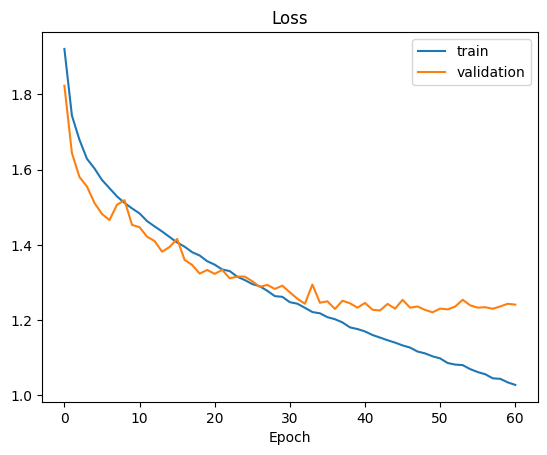

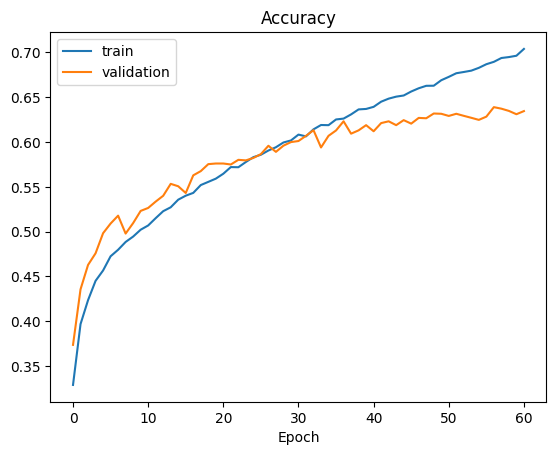

In [ ]:
plt.plot(metrics["train_loss"], label="train")
plt.plot(metrics["val_loss"], label="validation")
plt.legend()
plt.title("Loss")
plt.xlabel("Epoch")
plt.show()

plt.plot(metrics["train_accuracy"], label="train")
plt.plot(metrics["val_accuracy"], label="validation")
plt.legend()
plt.title("Accuracy")
plt.xlabel("Epoch")
plt.show()

In [ ]:
%tensorboard --logdir=runs_cifar

Reusing TensorBoard on port 6006 (pid 70333), started 1:57:17 ago. (Use '!kill 70333' to kill it.)

<IPython.core.display.Javascript object>

We can once again attempt to visualize the features learned by the first layer via plotting the weights in the shape of the input images. However, this becomes difficult to do "correctly" because we now have color images. With MNIST, we only had a single color channel, and so could plot the weights in different colors for positive/negative values. This no longer works with multiple input channels -- we have to plot the weights in RGB space. But this makes it impossible to really show positive/negative weights. The best we can do is somehow normalize the weights into the [0, 1] range. Then, bright values would indicate positive weights and ark values negative weights (for each color, respectively).

As such, don't worry too much about interpreting the plots below. Still, we will see that a properly trained and regularized model will have much more "distinct" features rather than the nosiy mess we have right now.

In [ ]:
def visualize_features(colormap="local", normalization="symmetric"):
    if colormap not in ["local", "global"]:
        raise ValueError("colormap argument should be 'local' or 'global'")
    if normalization not in ["symmetric", "full"]:
        raise ValueError ("normalization should be 'symmetric' (map 0 weights to 0.5) "
                          "or 'full' (map minimum to 0 and maximum to 1)")

    features = model[1].weight.detach().cpu().numpy()
    if colormap == "global":
        if normalization == "full":
            features -= features.min()
            features /= features.max()
        else:
            absmax = abs(features).max()
            features /= 2*absmax
            features += 0.5

    plt.figure(figsize=(12, 24))
    for ind, pattern in enumerate(features):
        if colormap == "local":
            if normalization == "full":
                pattern -= pattern.min()
                pattern /= pattern.max()
            else:
                absmax = abs(pattern).max()
                pattern /= 2*absmax
                pattern += 0.5

        plt.subplot(64, 32, ind+1)
        pattern = pattern.reshape(3, 32, 32).transpose((1, 2, 0))
        plt.imshow(pattern)
        plt.axis("off")
        #plt.colorbar()
    plt.suptitle("First layer features with {} colormaps and {} normalization".format(colormap, normalization))
    plt.show()

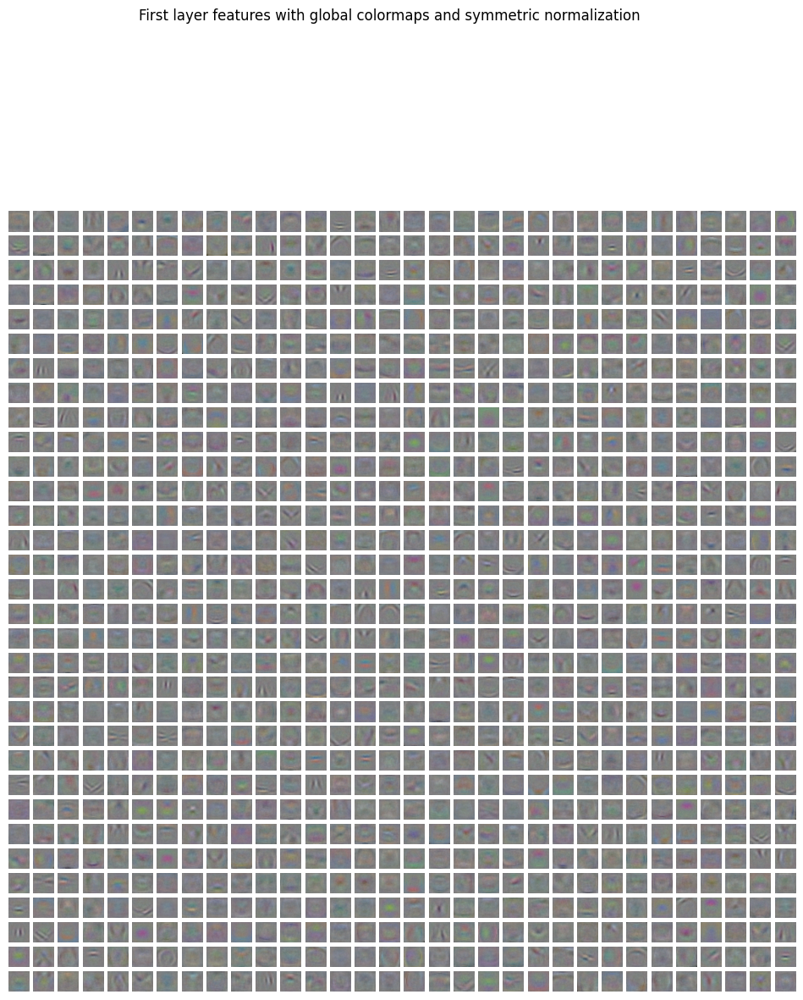

In [ ]:
#visualize_features("local", "full")
#visualize_features("global", "full")

#visualize_features("local", "symmetric")
visualize_features("global", "symmetric")

Finally, it's always a good idea at some classification results on the held-out data. We can see that the model does a good job an some examples, but fails badly on many others.

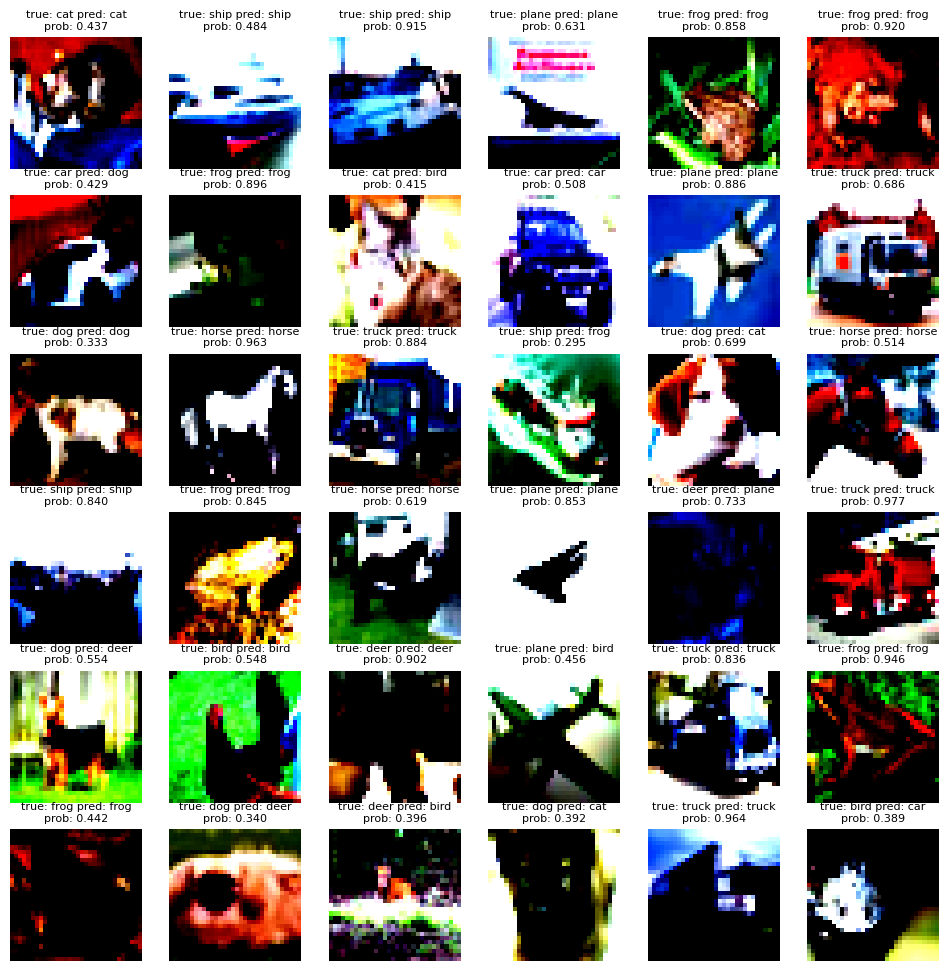

In [ ]:
classes = ["plane", "car", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

for X, y in test_dataloader:
    with torch.no_grad():
        probabilities = torch.nn.functional.softmax(model(X.to(device)), dim=1)
        predictions = probabilities.argmax(axis=1)

    plt.figure(figsize=(12, 12))
    for ind, img in enumerate(X[:36]):
        pred_here = predictions[ind]
        prob_here = probabilities[ind, pred_here].item()
        true_here = y[ind]

        plt.subplot(6, 6, ind+1)
        plt.imshow(img.permute((1, 2, 0)))
        plt.axis("off")

        plt.title("true: {} pred: {}\nprob: {:.3f}".format(classes[true_here], classes[pred_here], prob_here),
                  fontsize=8)
    plt.show()
    break